# Stock Price Prediction (Research)

## Imports

In [1]:
import yfinance as yf
import pandas as pd
import datetime
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split



## Loading in the stock data

In [2]:
# Scrape S&P 500 tickers from Wikipedia
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data = pd.read_html(url)
sp500_tickers = data[0]['Symbol'].tolist()


In [3]:
# Get the current date
end_date = datetime.datetime.now().strftime("%Y-%m-%d")

# start date
start_date = '2010-01-01'

sp500_data = {}

# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # Download historical data for the ticker from Yahoo Finance
    data = yf.download(ticker, start=start_date, end=end_date)
    
    # Store the data in a Pandas DataFrame with the ticker as the column name
    sp500_data[ticker] = pd.DataFrame(data)




[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [4]:
# Print the first few rows of each DataFrame
for ticker, data_frame in sp500_data.items():
    print(f"First few rows of {ticker}:")
    print(data_frame.head())


First few rows of MMM:
                 Open       High        Low      Close  Adj Close   Volume
Date                                                                      
2010-01-04  83.089996  83.449997  82.669998  83.019997  53.295410  3043700
2010-01-05  82.800003  83.230003  81.699997  82.500000  52.961575  2847000
2010-01-06  83.879997  84.599998  83.510002  83.669998  53.712662  5268500
2010-01-07  83.320000  83.760002  82.120003  83.730003  53.751183  4470100
2010-01-08  83.690002  84.320000  83.300003  84.320000  54.129940  3405800
First few rows of AOS:
                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2010-01-04  7.295000  7.480000  7.261667  7.435000   6.009511  1104600
2010-01-05  7.431667  7.431667  7.308333  7.340000   5.932724  1207200
2010-01-06  7.335000  7.405000  7.301667  7.343333   5.935417   663000
2010-01-07  7.356667  7.425000  7.311667  7.365000   5.952930   564000
201

## Checking for missing values

In [5]:
# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # Download historical data for the ticker from Yahoo Finance
    data = yf.download(ticker, start=start_date, end=end_date)
    
    # Store the data in a Pandas DataFrame with the ticker as the column name
    sp500_data[ticker] = pd.DataFrame(data)
    
    # Check for missing values
    missing_values = sp500_data[ticker].isnull().sum()
    
    # missing values for each ticker
    print(f"Missing values for {ticker}:")
    print(missing_values)


[*********************100%%**********************]  1 of 1 completed


Missing values for MMM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ABT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ABBV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ACN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ADBE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AFL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for A:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for APD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ABNB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AKAM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ALB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ARE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ALGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ALLE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LNT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ALL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GOOGL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GOOG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMZN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMCR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AEE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AEP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AXP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AIG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AWK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AME:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for APH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ADI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ANSS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for APA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AAPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for APTV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ACGL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ADM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ANET:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AJG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AIZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for T:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ATO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ADSK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ADP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AZO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AVB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AVY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AXON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BKR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BALL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BBWI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BAX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BDX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')


Missing values for BRK.B:
Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64


[*********************100%%**********************]  1 of 1 completed


Missing values for BBY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BIO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TECH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BIIB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BLK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BKNG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BWA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BXP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BMY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AVGO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-01 -> 2024-03-14)')


Missing values for BRO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BF.B:
Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64


[*********************100%%**********************]  1 of 1 completed


Missing values for BLDR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CDNS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CZR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CPT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CPB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CAH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KMX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CARR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CTLT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CBOE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CBRE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CDW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CNC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CNP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CHRW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CRL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SCHW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CHTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CVX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CHD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CINF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CTAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CSCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for C:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CFG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CME:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CTSH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMCSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CAG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ED:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for STZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CEG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CPRT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GLW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CTVA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CSGP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CTRA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CVS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DHR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DRI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DVA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for XRAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DVN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DXCM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FANG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DLR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DFS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DLTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for D:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DPZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DOV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DHI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DTE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DUK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ETN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EBAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ECL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EIX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ELV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LLY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EMR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ENPH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ETR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EOG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EPAM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EQT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EFX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EQIX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EQR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ESS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ETSY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EVRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EXC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EXPE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EXPD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EXR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for XOM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FFIV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FDS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FICO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FAST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FRT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FDX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FITB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FSLR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FLT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for F:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FTNT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FTV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FOXA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FOX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FCX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GRMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GEHC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GNRC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GPC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GILD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GPN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HIG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HCA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DOC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HSIC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HSY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HPE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HLT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HOLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HRL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HWM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HPQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HUBB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HUM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HBAN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HII:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IBM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IEX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IDXX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ITW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ILMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for INCY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PODD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for INTC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ICE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IFF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for INTU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ISRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IVZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for INVH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IQV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IRM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JBHT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JBL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JKHY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for J:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JNJ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JPM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JNPR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for K:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KVUE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KDP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KEY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KEYS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KIM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KMI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KLAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KHC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LHX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LRCX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LVS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LDOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LIN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LYV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LKQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for L:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LULU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LYB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MTB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MRO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MPC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MKTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MAR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MLM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MTCH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MKC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MDT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MRK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for META:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MET:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MTD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MGM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCHP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MSFT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MAA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MRNA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MHK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MOH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TAP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MDLZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MPWR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MNST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MSI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MSCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NDAQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NTAP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NFLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NEM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NWSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NWS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NEE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NKE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NDSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NSC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NTRS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NOC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NCLH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NUE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NVDA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NVR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NXPI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ORLY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for OXY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ODFL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for OMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for OKE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ORCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for OTIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PCAR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PKG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PANW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PARA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PAYX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PAYC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PYPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PEP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PFE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PCG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PXD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for POOL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PFG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PGR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PLD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PRU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PEG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PTC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PHM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for QRVO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PWR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for QCOM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DGX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RJF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for O:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for REG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for REGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RSG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RMD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RVTY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RHI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ROK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ROL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ROP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ROST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SPGI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CRM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SBAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SLB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for STX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SRE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SHW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SWKS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SJM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SNA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LUV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SWK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SBUX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for STT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for STLD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for STE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SYK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SYF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SNPS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SYY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TMUS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TROW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TTWO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TPR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TRGP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TGT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TEL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TDY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TFX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TER:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TSLA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TXN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TXT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TMO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TJX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TSCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TDG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TRV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TRMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TYL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for USB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for UBER:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UDR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ULTA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UNP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UPS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for URI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UNH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UHS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VLO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VLTO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VRSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VRSK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VRTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VTRS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VICI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for V:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WRB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WAB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WBA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WBD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WEC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WELL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WDC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WRK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WHR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WTW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GWW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WYNN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for XEL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for XYL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for YUM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ZBRA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ZBH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ZION:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed

Missing values for ZTS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


In [6]:
print(sp500_data['AAPL']['Open'])

Date
2010-01-04      7.622500
2010-01-05      7.664286
2010-01-06      7.656429
2010-01-07      7.562500
2010-01-08      7.510714
                 ...    
2024-03-07    169.149994
2024-03-08    169.000000
2024-03-11    172.940002
2024-03-12    173.149994
2024-03-13    172.770004
Name: Open, Length: 3572, dtype: float64


There was no timezone found for 'BKR' and 'BR', hency why we are going to remove the tickers

In [7]:
#['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
#['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 1990-01-01 -> 2024-02-11)')

In [8]:
tickers_to_drop = ['BRK', 'BF'] 

for symbol in tickers_to_drop:
    sp500_data.pop(symbol, None)


In [9]:
# Print keys before removal
print("Keys before removal:", sp500_data.keys())

# Remove tickers
tickers_to_drop = ['BRK', 'BF','BRK.B','BF.B','IQV']
for symbol in tickers_to_drop:
    sp500_data.pop(symbol, None)

# Print keys after removal
print("Keys after removal:", sp500_data.keys())


Keys before removal: dict_keys(['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A', 'APD', 'ABNB', 'AKAM', 'ALB', 'ARE', 'ALGN', 'ALLE', 'LNT', 'ALL', 'GOOGL', 'GOOG', 'MO', 'AMZN', 'AMCR', 'AEE', 'AAL', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'AME', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ADM', 'ANET', 'AJG', 'AIZ', 'T', 'ATO', 'ADSK', 'ADP', 'AZO', 'AVB', 'AVY', 'AXON', 'BKR', 'BALL', 'BAC', 'BK', 'BBWI', 'BAX', 'BDX', 'BRK.B', 'BBY', 'BIO', 'TECH', 'BIIB', 'BLK', 'BX', 'BA', 'BKNG', 'BWA', 'BXP', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'BF.B', 'BLDR', 'BG', 'CDNS', 'CZR', 'CPT', 'CPB', 'COF', 'CAH', 'KMX', 'CCL', 'CARR', 'CTLT', 'CAT', 'CBOE', 'CBRE', 'CDW', 'CE', 'COR', 'CNC', 'CNP', 'CF', 'CHRW', 'CRL', 'SCHW', 'CHTR', 'CVX', 'CMG', 'CB', 'CHD', 'CI', 'CINF', 'CTAS', 'CSCO', 'C', 'CFG', 'CLX', 'CME', 'CMS', 'KO', 'CTSH', 'CL', 'CMCSA', 'CMA', 'CAG', 'COP', 'ED', 'STZ', 'CEG', 'COO', 'CPRT', 'GLW', 'CTVA', 'CSGP', 'COST', 'CTRA', 

In [10]:
ticker_to_check = 'BRK.B' and 'BF.B' and 'IQV'
print(ticker_to_check in sp500_data.keys()) 

False


There are no missing values for any of the stock tickers. We can proceed.

## Visualization of Stock Prices

Before we apply the engineering on the features and apply the machine learning models, we are going to plot the stock tickers to see the general movement of the stocks.

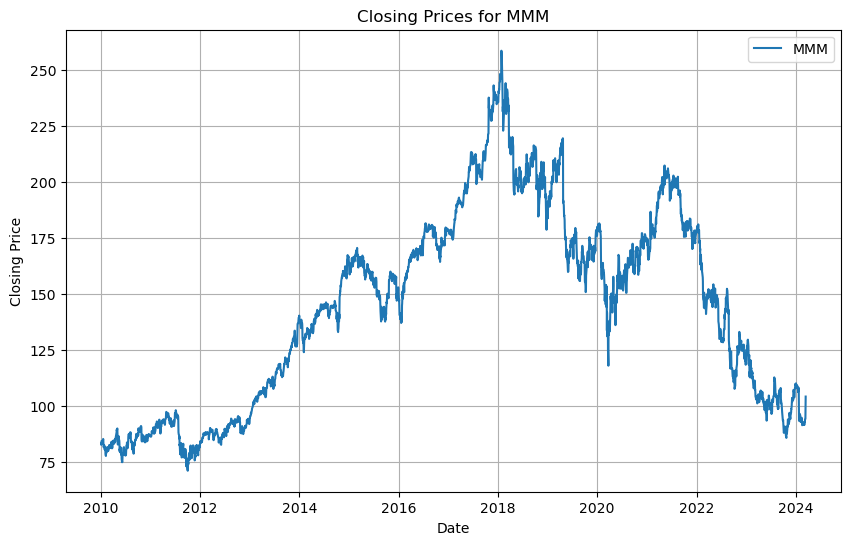

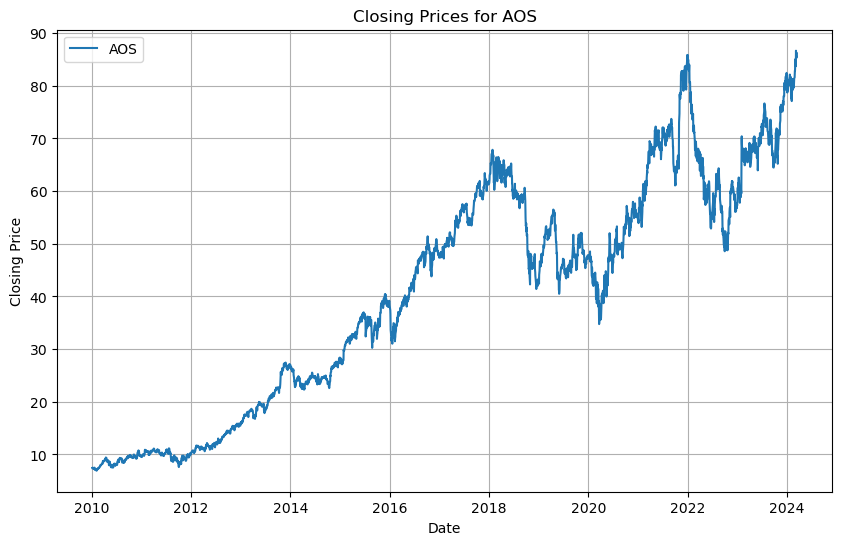

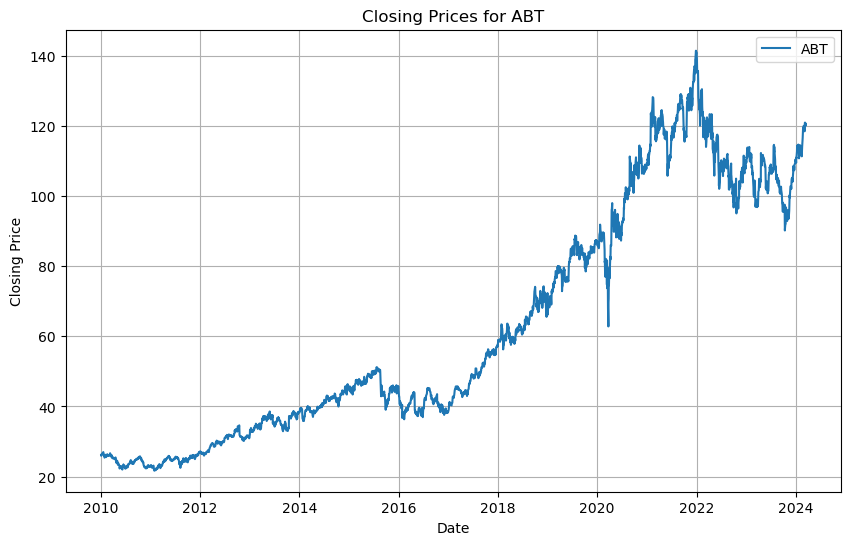

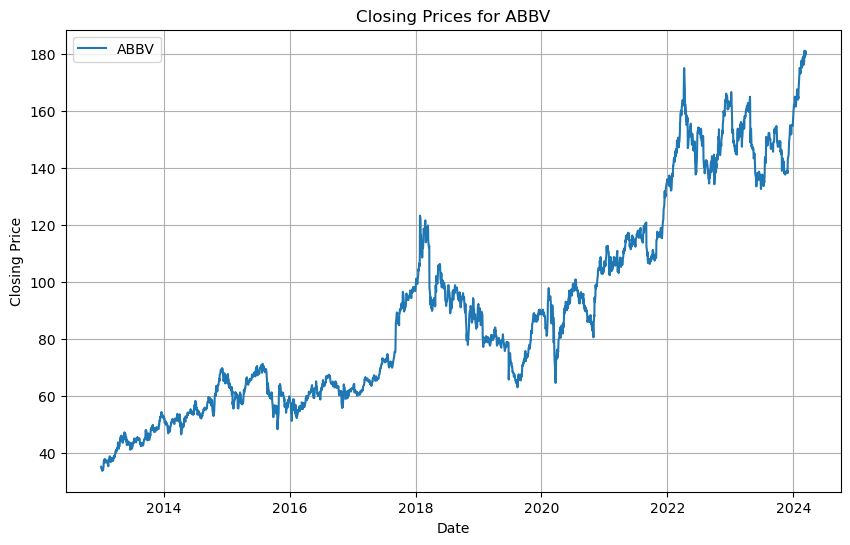

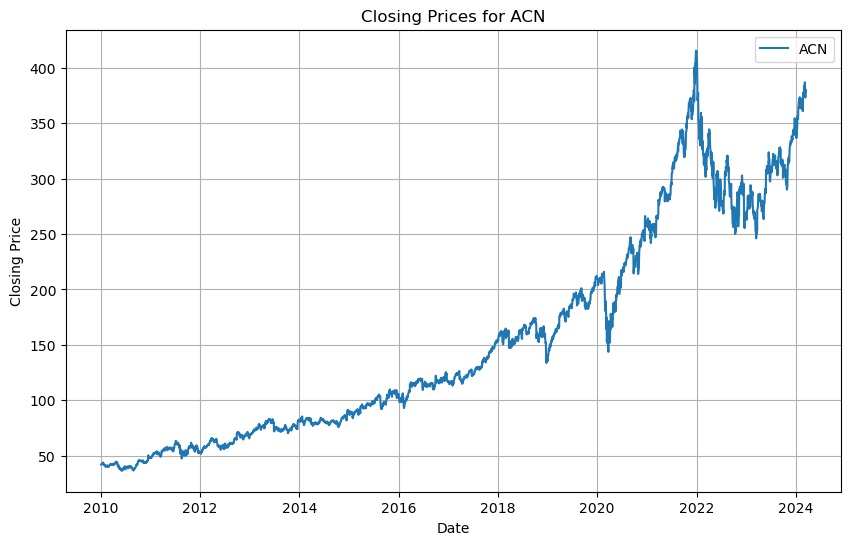

...

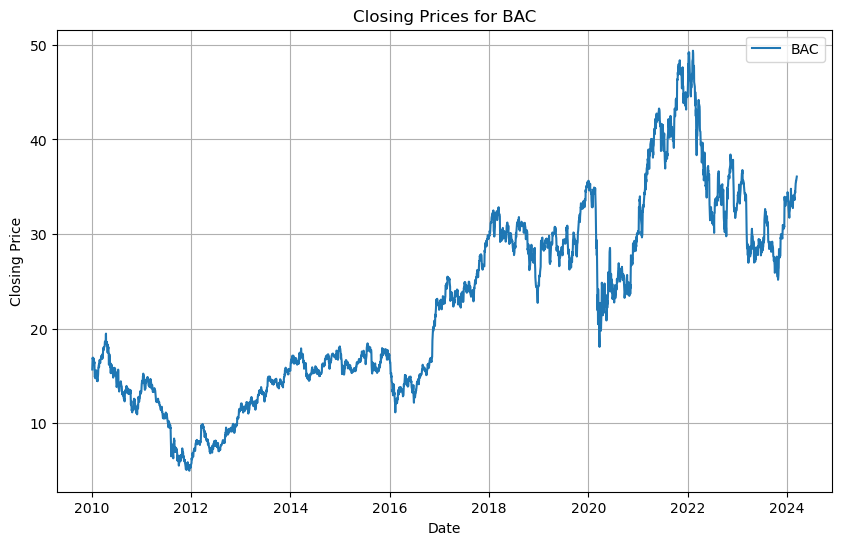

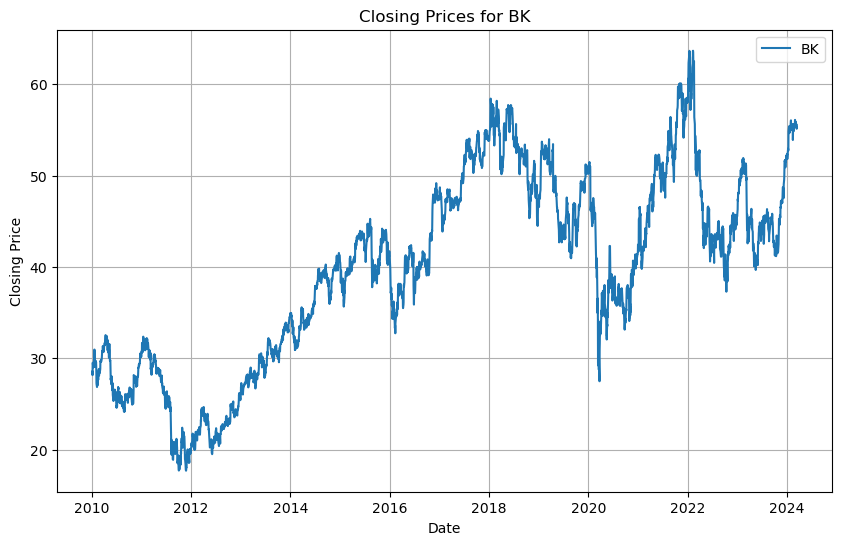

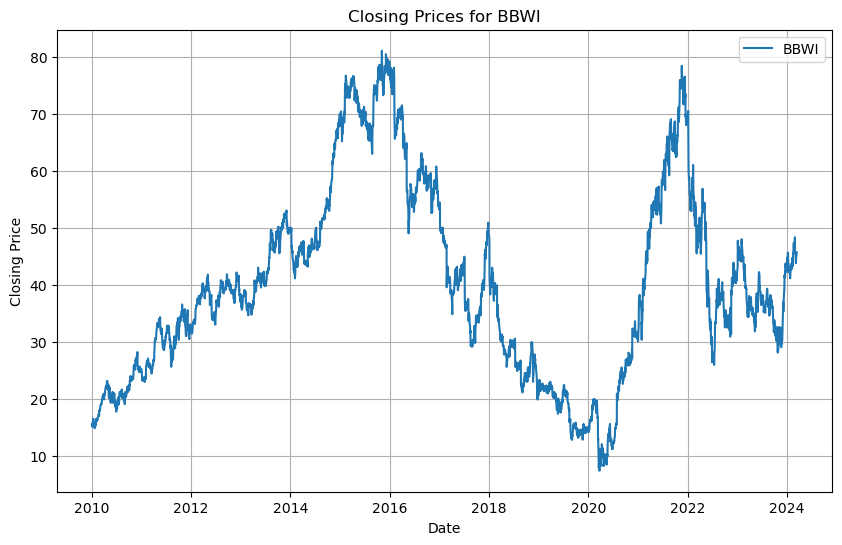

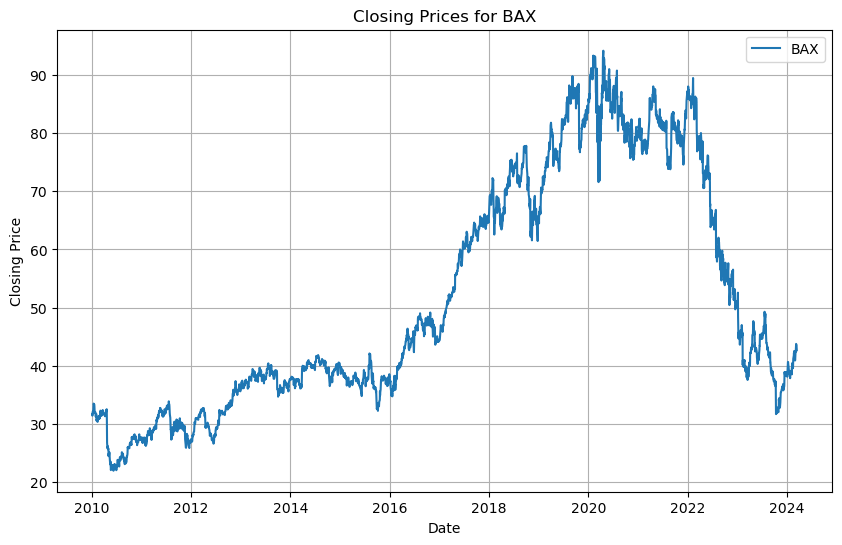

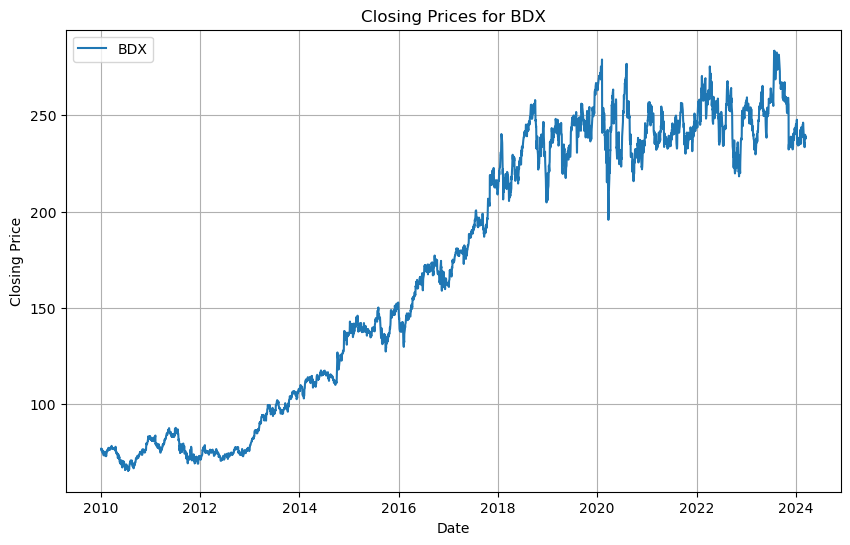

KeyError: 'BRK.B'

In [11]:
# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # closing prices for the current ticker
    closing_prices = sp500_data[ticker]['Close']
    
    # Plot the closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(closing_prices, label=ticker)
    plt.title(f"Closing Prices for {ticker}")
    plt.xlabel("Date")
    plt.ylabel("Closing Price")
    plt.legend()
    plt.grid(True)
    plt.show()

To analyze some of the data we are going to apply the 100 day and 200 day moving average to each ticker

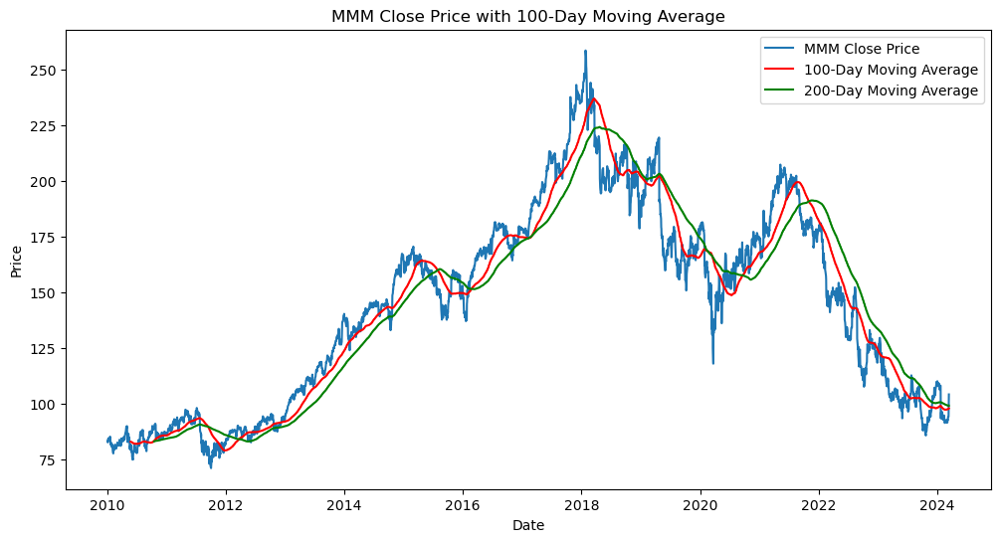

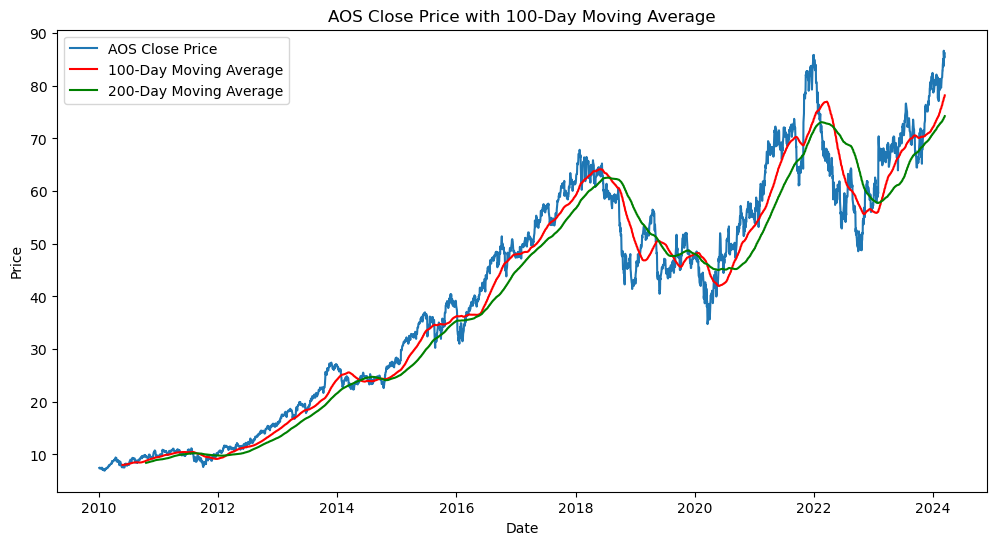

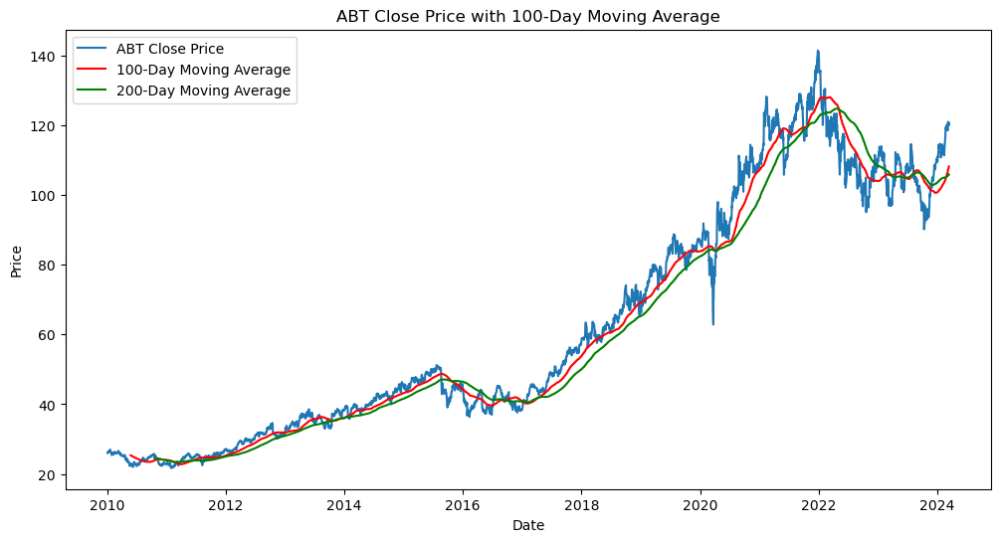

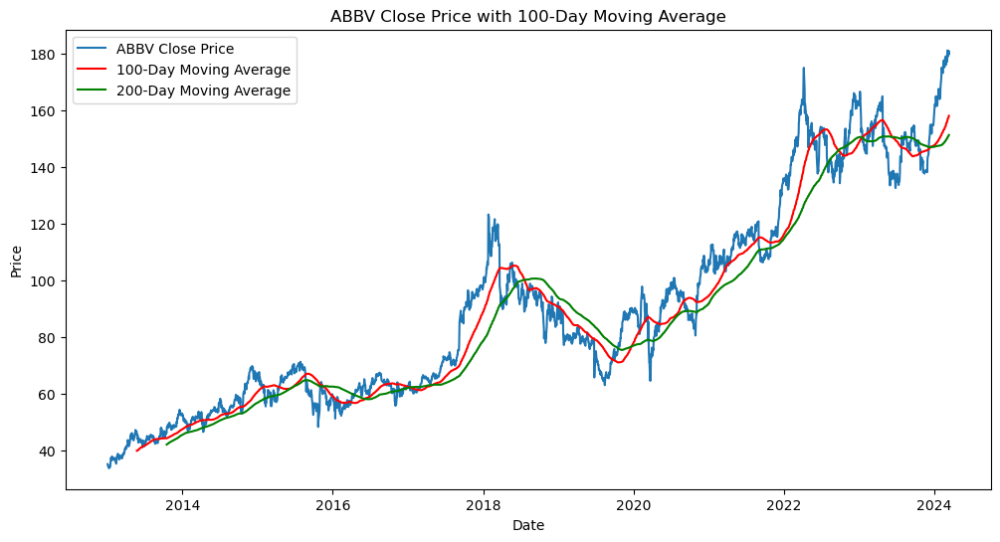

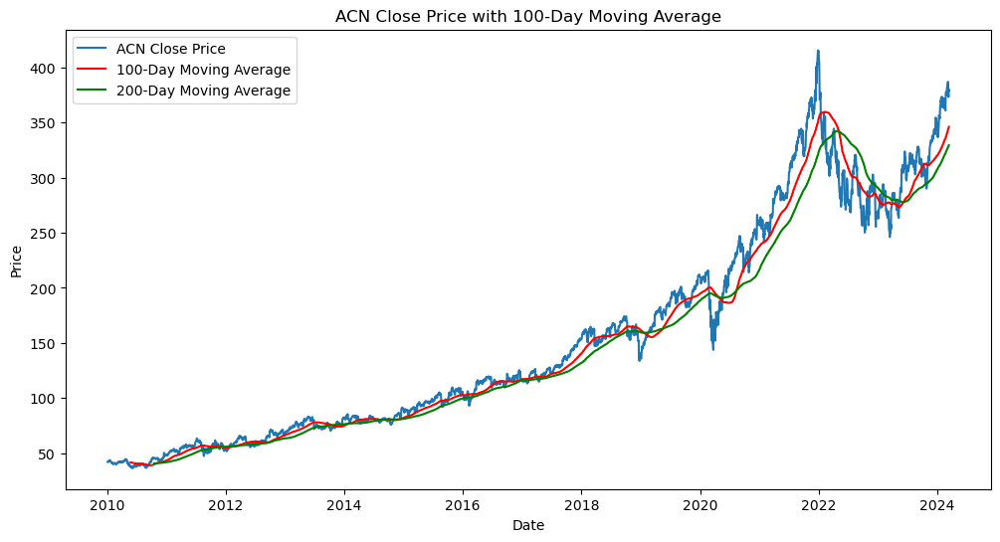

...

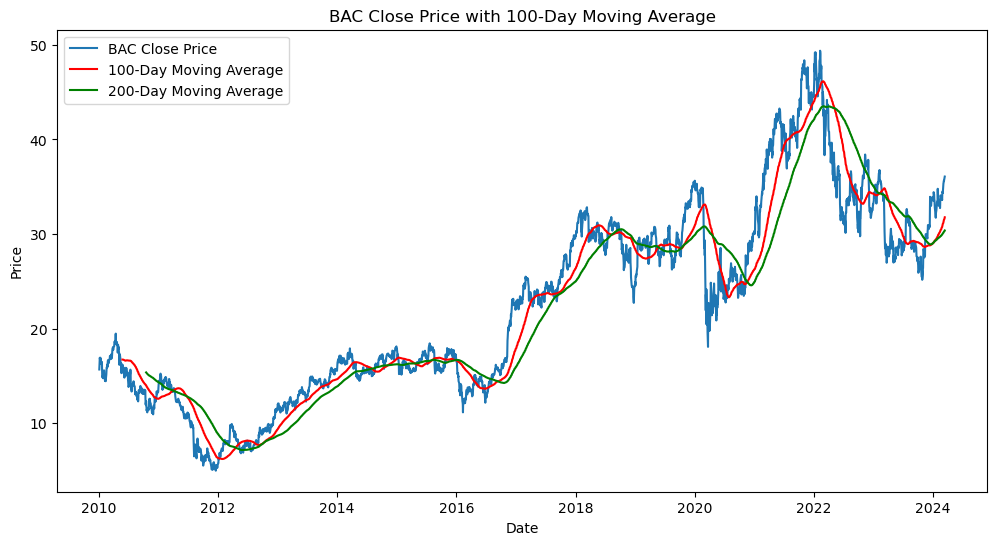

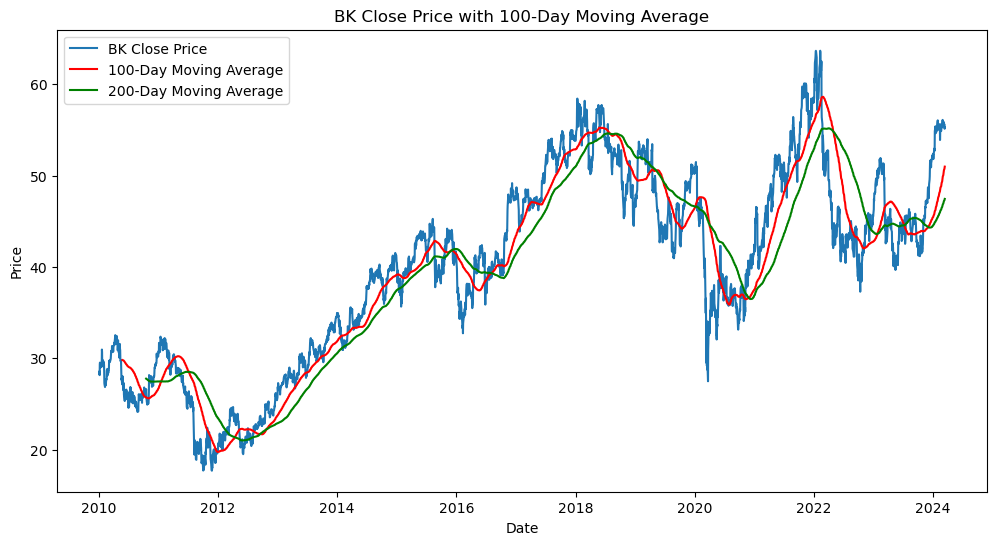

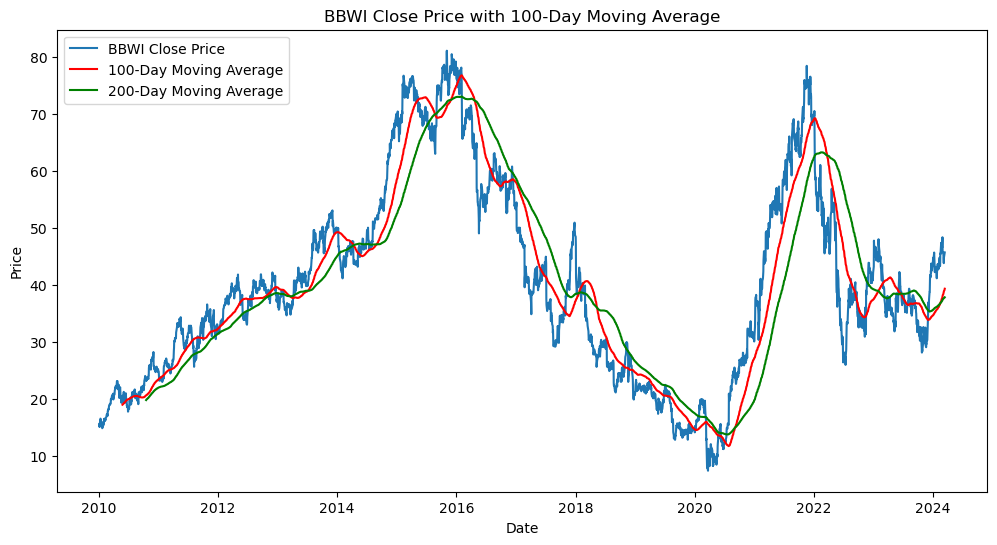

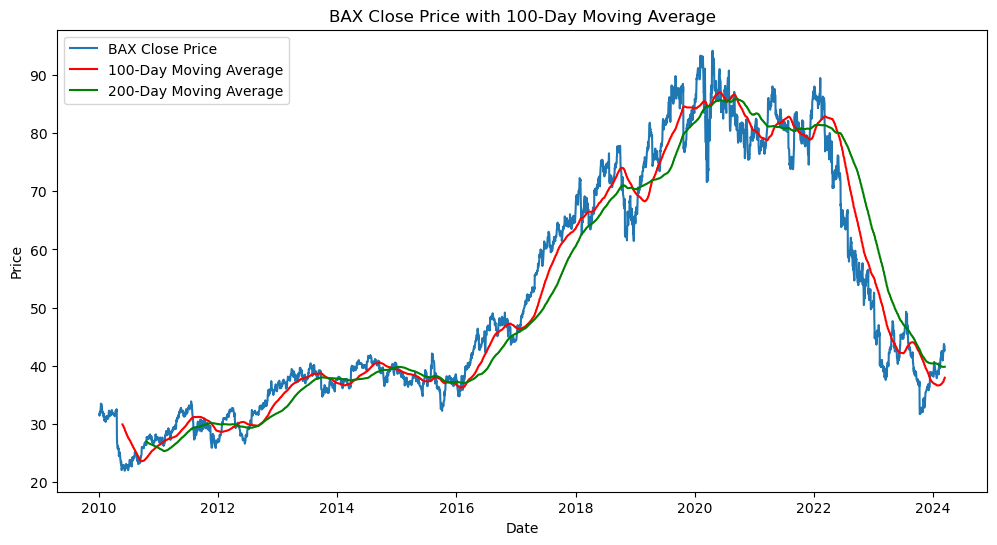

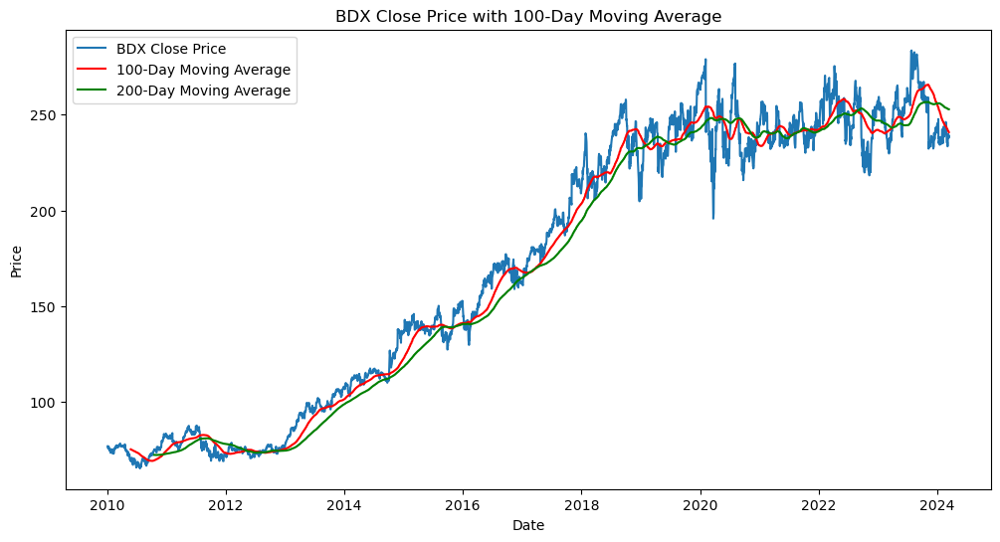

KeyError: 'BRK.B'

In [12]:
import matplotlib.pyplot as plt


for ticker in sp500_tickers:
    df = sp500_data[ticker]

    # Calculate the 100 and 200 day moving average
    ma100 = df.Close.rolling(100).mean()
    ma200 = df.Close.rolling(200).mean()
    plt.figure(figsize=(12, 6))
    plt.plot(df.Close, label=f'{ticker} Close Price')
    plt.plot(ma100, 'r', label='100-Day Moving Average')
    plt.plot(ma200, 'g', label='200-Day Moving Average')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(f'{ticker} Close Price with 100-Day Moving Average')
    plt.legend()
    plt.show()


## Feature engineering

In [ ]:
data_training = pd.DataFrame(df['Close'][0:int(len(df)*.7)])
data_testing = pd.DataFrame(df['Close'][0:int(len(df)*.7)])

### Scaling

We are going to scale the data using MinMaxScaler

The last row of the target column which should represent the stock movement that needs to be predicted is nan. We are going to remove that row from each ticker and apply the models

In [30]:
print(sp500_data['AAPL'].head)

<bound method NDFrame.head of                   Open        High         Low       Close   Adj Close  \
Date                                                                     
2010-01-04    7.622500    7.660714    7.585000    7.643214    6.470741   
2010-01-05    7.664286    7.699643    7.616071    7.656429    6.481929   
2010-01-06    7.656429    7.686786    7.526786    7.534643    6.378826   
2010-01-07    7.562500    7.571429    7.466071    7.520714    6.367032   
2010-01-08    7.510714    7.571429    7.466429    7.570714    6.409362   
...                ...         ...         ...         ...         ...   
2024-03-06  171.059998  171.240005  168.679993  169.119995  169.119995   
2024-03-07  169.149994  170.729996  168.490005  169.000000  169.000000   
2024-03-08  169.000000  173.699997  168.940002  170.729996  170.729996   
2024-03-11  172.940002  174.380005  172.050003  172.750000  172.750000   
2024-03-12  173.149994  174.029999  171.009995  173.229996  173.229996   

       

In [32]:
from sklearn.preprocessing import MinMaxScaler

scaled_sp500_data = {}

def scale_data_for_ticker(df):
    """Scales numeric columns in the DataFrame using MinMaxScaler."""
    # Copy of the original DataFrame to avoid modifying in place
    scaled_df = df.copy()
    
    # Initialize MinMaxScaler
    scaler = MinMaxScaler()
    
    # Get numeric columns excluding 'Close'
    numeric_cols = scaled_df.select_dtypes(include=['number']).columns.drop('Close')
    
    # Apply scaling to numeric columns if there are any numeric columns
    if numeric_cols.size > 0:
        scaled_df[numeric_cols] = scaler.fit_transform(scaled_df[numeric_cols])
    
    return scaled_df

# Scale data for each ticker
for ticker, df in sp500_data.items():
    scaled_sp500_data[ticker] = scale_data_for_ticker(df)


In [33]:
from sklearn.preprocessing import MinMaxScaler

def scale_data_for_ticker(ticker, df):
    # copy of the original DataFrame
    scaled_df = df.copy()
    
    # Initialize MinMaxScaler
    scaler = MinMaxScaler()
    
    # Get numeric columns excluding 'Close'
    numeric_cols = scaled_df.select_dtypes(include='number').columns
    
    # Apply scaling to numeric columns
    scaled_df[numeric_cols] = scaler.fit_transform(scaled_df[numeric_cols])
    
    return scaled_df


ticker_to_scale = 'AAPL' # change ticker to liking
scaled_sp500_data[ticker_to_scale] = scale_data_for_ticker(ticker_to_scale, sp500_data[ticker_to_scale])


In [34]:
# Check for nan values in each column
nan_counts = df.isna().sum()

# Print the number of NaN values in each column
print("Number of NaN values in each column:")
print(nan_counts)


Number of NaN values in each column:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


In [35]:
# Iterate over each ticker and its corresponding DataFrame
for ticker, df in sp500_data.items():
    # Drop the last rowd
    sp500_data[ticker] = df.drop(df.tail(1).index, inplace=False)

In [36]:
print(sp500_data['AAPL']) 

                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2010-01-04    7.622500    7.660714    7.585000    7.643214    6.470741   
2010-01-05    7.664286    7.699643    7.616071    7.656429    6.481929   
2010-01-06    7.656429    7.686786    7.526786    7.534643    6.378826   
2010-01-07    7.562500    7.571429    7.466071    7.520714    6.367032   
2010-01-08    7.510714    7.571429    7.466429    7.570714    6.409362   
...                ...         ...         ...         ...         ...   
2024-03-05  170.759995  172.039993  169.619995  170.119995  170.119995   
2024-03-06  171.059998  171.240005  168.679993  169.119995  169.119995   
2024-03-07  169.149994  170.729996  168.490005  169.000000  169.000000   
2024-03-08  169.000000  173.699997  168.940002  170.729996  170.729996   
2024-03-11  172.940002  174.380005  172.050003  172.750000  172.750000   

               Volume  
Date         

For all of the following models we are going to apply it to all models but just pick the AAPL (Apple) stock and compare that for each of the applied models

## Linear Regression

In [37]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Dictionary to store the models and evaluation results
models = {}

# Iterate over each ticker and its corresponding DataFrame
for ticker, df in sp500_data.items():
    # Separate features and target variable
    X = df.drop(columns=['Close'])  
    y = df['Close'] 
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Initialize Linear Regression model
    model = LinearRegression()
    
    # Fit the model to the training data
    model.fit(X_train, y_train)
    
    # Evaluate the model on the testing data
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Store the model and evaluation results
    models[ticker] = {'model': model, 'mse': mse, 'r2': r2}

# Access individual model and evaluation results
for ticker, info in models.items():
    print(f"Ticker: {ticker}, Mean Squared Error: {info['mse']}, R^2 Score: {info['r2']}")



Ticker: MMM, Mean Squared Error: 0.4274396859817825, R^2 Score: 0.999777522669354
Ticker: AOS, Mean Squared Error: 0.07022480927194032, R^2 Score: 0.9998562770635866
Ticker: ABT, Mean Squared Error: 0.1277287314902063, R^2 Score: 0.9998897154097828
Ticker: ABBV, Mean Squared Error: 0.3479170458643095, R^2 Score: 0.9997427606305946
Ticker: ACN, Mean Squared Error: 0.7462454472980334, R^2 Score: 0.9999202652578553
Ticker: ADBE, Mean Squared Error: 7.254670706119098e-26, R^2 Score: 1.0
Ticker: AMD, Mean Squared Error: 1.1815404477149686e-19, R^2 Score: 1.0
Ticker: AES, Mean Squared Error: 0.01240145536136582, R^2 Score: 0.9994948546285443
Ticker: AFL, Mean Squared Error: 0.0513722110984348, R^2 Score: 0.9997827621994353
Ticker: A, Mean Squared Error: 0.137022796332999, R^2 Score: 0.999920358101359
Ticker: APD, Mean Squared Error: 0.9110652432123223, R^2 Score: 0.9998528490880144
Ticker: ABNB, Mean Squared Error: 3.0070608086629633e-26, R^2 Score: 1.0
Ticker: AKAM, Mean Squared Error: 4.81

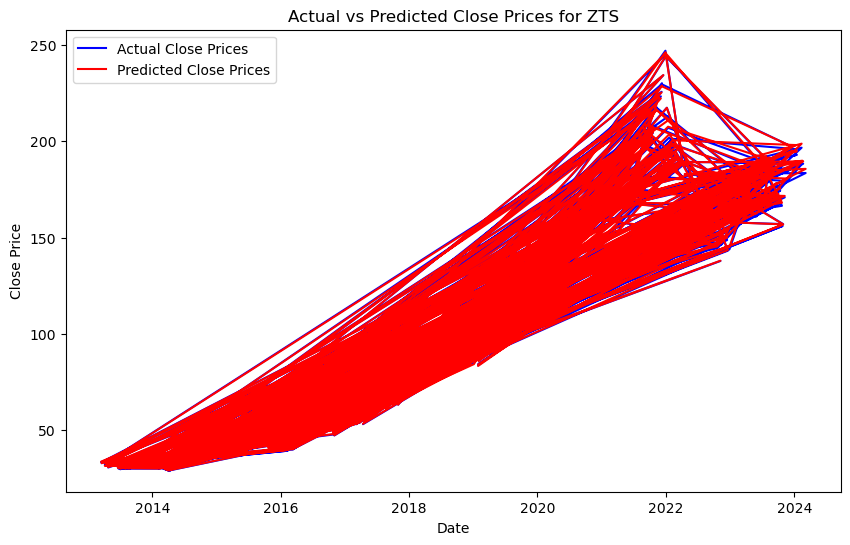

In [38]:
# Plotting Actual vs Predicted Prices
plt.figure(figsize=(10, 6))
plt.plot(y_test.index, y_test, color='blue', label='Actual Close Prices' )
plt.plot(y_test.index, y_pred, color='red', label='Predicted Close Prices')
plt.title(f'Actual vs Predicted Close Prices for {ticker}')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

In [39]:
print(models['TSLA'])

{'model': LinearRegression(), 'mse': 3.276492935199359e-17, 'r2': 1.0}


## Random Forest Regressor

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best Parameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}
Mean Squared Error: 2.6045809253080817e-06


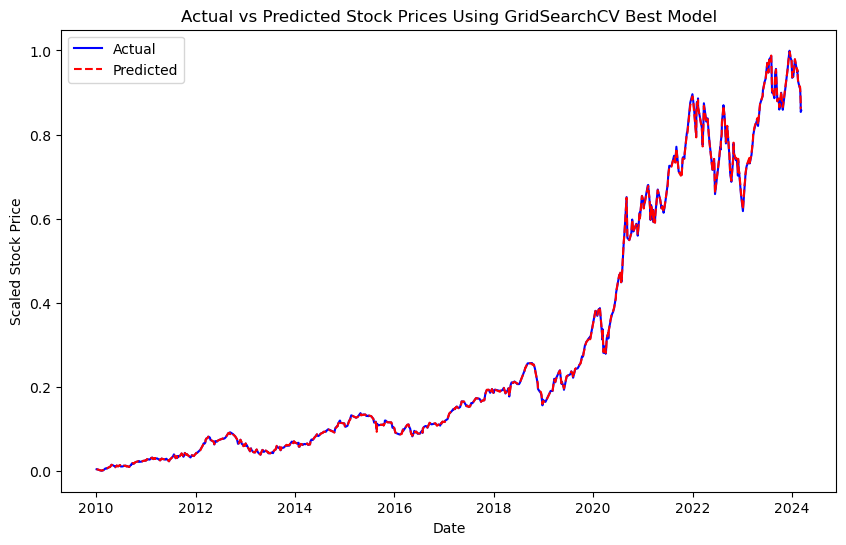

[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END max_depth=None, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=10, min_samples_split=5, n_estimators=100; total time=   0.6s
[CV] END max_depth=10, min_samples_split=5, n_estimators=200; total time=   1.2s
[CV] END max_depth=20, min_samples_split=2, n_estimators=200; total time=   1.4s
[CV] END max_depth=None, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, min_samples_split=5, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, min_samples_split=5, n_estimators=200; total time=   1.3s
[CV] END max_depth=10, min_samples_split=2, n_estimators=200; total time=   1.2s
[CV] END max_dep

In [40]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

# and ticker_to_scale is a string representing the ticker of interest
scaled_df = scaled_sp500_data[ticker_to_scale]

# Separate features and target variable
X = scaled_df.drop(columns=['Close'])
y = scaled_df['Close']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5]
}

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                           param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

# Use the best model to predict on the testing data
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Calculate the Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Create a DataFrame for plotting actual vs predicted
df_plot = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred}, index=y_test.index)
df_plot.sort_index(inplace=True)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_plot['Actual'], label='Actual', color='blue')
plt.plot(df_plot['Predicted'], label='Predicted', color='red', linestyle='--')
plt.title('Actual vs Predicted Stock Prices Using GridSearchCV Best Model')
plt.xlabel('Date')
plt.ylabel('Scaled Stock Price')
plt.legend()
plt.show()


In [41]:
import numpy as np
import pandas as pd

# Define the start date for future predictions (the day after the current day)
start_date = '2024-03-09'

# Define the number of future days you want to predict
num_days = 2000  

# Create a date range for the future dates
future_dates = pd.date_range(start=start_date, periods=num_days, freq='D')

#  empty DataFrame for future feature values with the future dates as the index
X_future = pd.DataFrame(index=future_dates)

for column in X.columns:
    X_future[column] = X[column].iloc[-1]



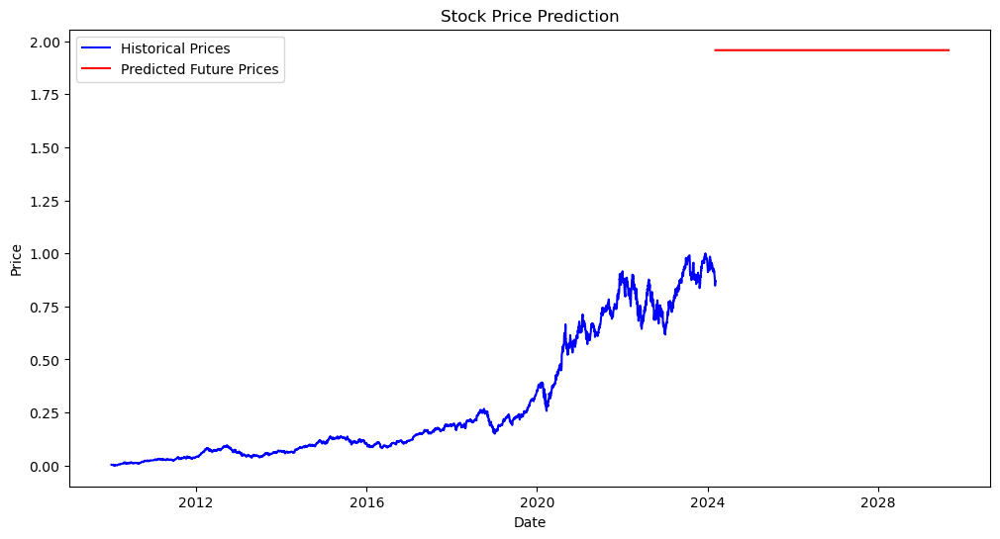

In [42]:
# Predict future stock prices
y_future_pred = model.predict(X_future)


# Concatenate historical and future predictions for plotting
y_combined = pd.concat([y, pd.Series(y_future_pred, index=X_future.index)])

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y.index, y, label='Historical Prices', color='blue')
plt.plot(X_future.index, y_future_pred, label='Predicted Future Prices', color='red', linestyle='-')
plt.title('Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


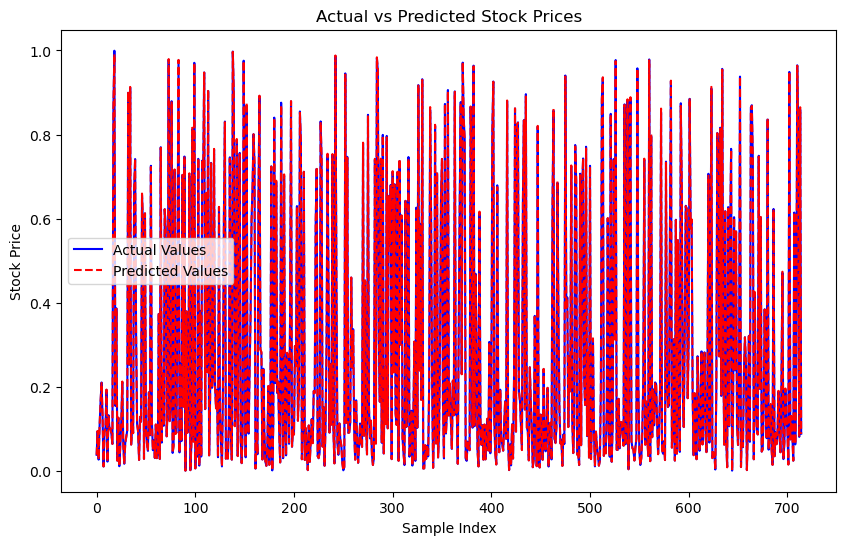

In [43]:
# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.plot(y_test.reset_index(drop=True), label='Actual Values', color='blue')
plt.plot(y_pred, label='Predicted Values', color='red', linestyle='--')
plt.title('Actual vs Predicted Stock Prices')
plt.xlabel('Sample Index')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

In [44]:
print(y.shape)

(3571,)


In [45]:
print(X.shape)

(3571, 5)


In [46]:
print(models['TSLA'])

{'model': LinearRegression(), 'mse': 3.276492935199359e-17, 'r2': 1.0}


## RNN

### Data Preparation

In [50]:
apple_df = sp500_data['AAPL']
print(apple_df)

                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2010-01-04    7.622500    7.660714    7.585000    7.643214    6.470741   
2010-01-05    7.664286    7.699643    7.616071    7.656429    6.481929   
2010-01-06    7.656429    7.686786    7.526786    7.534643    6.378826   
2010-01-07    7.562500    7.571429    7.466071    7.520714    6.367032   
2010-01-08    7.510714    7.571429    7.466429    7.570714    6.409362   
...                ...         ...         ...         ...         ...   
2024-03-05  170.759995  172.039993  169.619995  170.119995  170.119995   
2024-03-06  171.059998  171.240005  168.679993  169.119995  169.119995   
2024-03-07  169.149994  170.729996  168.490005  169.000000  169.000000   
2024-03-08  169.000000  173.699997  168.940002  170.729996  170.729996   
2024-03-11  172.940002  174.380005  172.050003  172.750000  172.750000   

               Volume  
Date         

For the recurrent neural network models are going to have a create sequence method which will create sequences

In [51]:
# Create sequences for prediction
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        y.append(data[i+sequence_length])
    return np.array(X), np.array(y)

In [55]:
# Define a function to plot loss curve
def plot_loss(history):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0038 - val_loss: 0.0160
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 6.6101e-05 - val_loss: 0.0104
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.7906e-05 - val_loss: 0.0107
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.3534e-05 - val_loss: 0.0106
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.1956e-05 - val_loss: 0.0094
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.0999e-05 - val_loss: 0.0087
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 4.2122e-05 - val_loss: 0.0069
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 4.4173e-05 - val_loss: 0.0072
Epoch 9/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 3.7687e-05 - val_loss: 0.0072
Epoch 10/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.8965e-05 - val_loss: 0.0058
Epoch 11/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 3.1331e-05 - val_loss: 0.0054
Epoch 12/30
62/62 ━━━━━

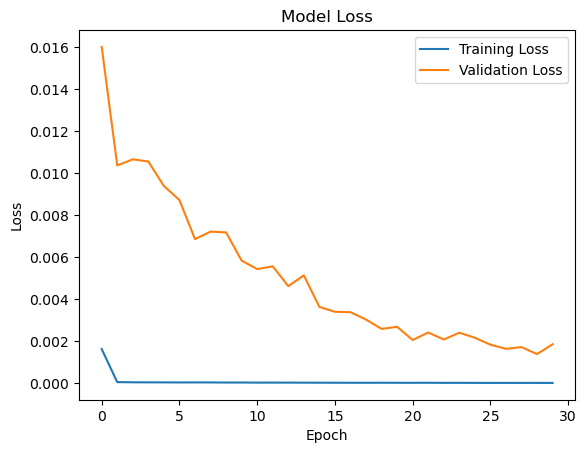

In [68]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.initializers import Orthogonal
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input

# Data preprocessing
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(apple_df['Close'].values.reshape(-1, 1))

# Define sequence length and create sequences
sequence_length = 500

X, y = create_sequences(scaled_data, sequence_length)

# Split data into train and test sets
split_index = int(len(X) * 0.8)
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

# Build a more baseline RNN model
model = Sequential([
    Input(shape=(sequence_length, 1)),
    SimpleRNN(units=50, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
    Dense(units=1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train, y_train, epochs=30, batch_size=32, verbose=1, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test, verbose=0)

# Make predictions
predictions = model.predict(X_test)

# Plot loss curves
plot_loss(history)

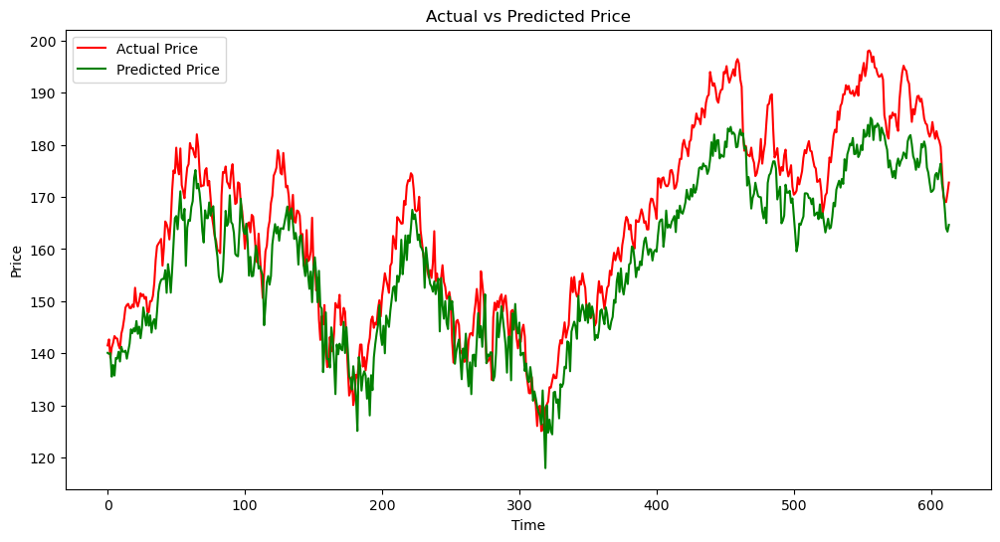

In [77]:
import matplotlib.pyplot as plt

# Inverse transform the scaled data to get actual prices
y_test_actual = scaler.inverse_transform(y_test)
predictions_actual = scaler.inverse_transform(predictions)

# Plot the actual and predicted prices
plt.figure(figsize=(12, 6))
plt.plot(y_test_actual, color='red', label='Actual Price')
plt.plot(predictions_actual, color='green', label='Predicted Price')
plt.title('Actual vs Predicted Price')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━

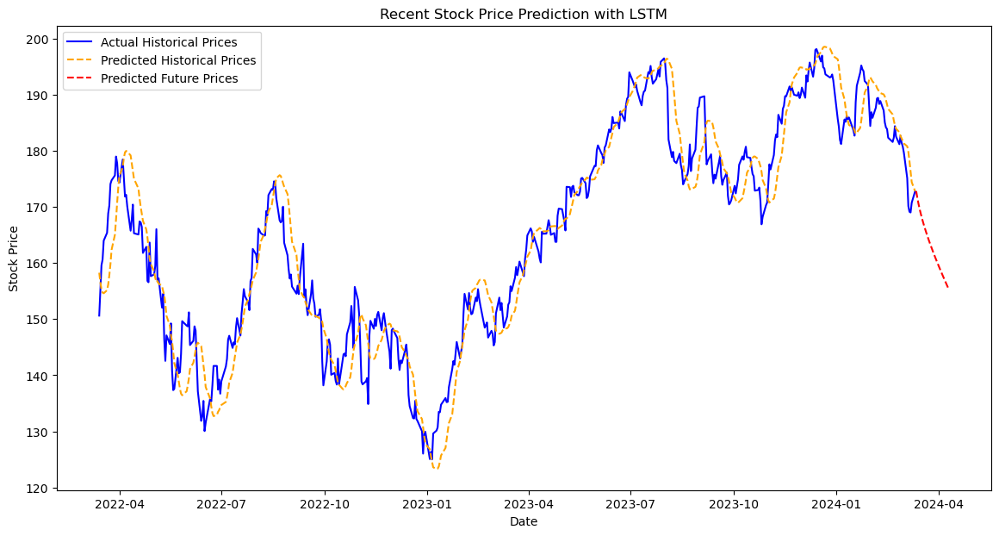

In [146]:
# Making predictions on the entire historical dataset
historical_predictions = model.predict(np.vstack((X_train, X_test)))
historical_predictions_scaled = scaler.inverse_transform(historical_predictions)

# Combine historical actual prices and predictions for plotting
historical_dates = apple_df.index[sequence_length:len(historical_predictions_scaled) + sequence_length]
historical_actual = scaler.inverse_transform(scaled_data[sequence_length:len(historical_predictions_scaled) + sequence_length])

# Making future predictions
n_future_steps = 30  # Adjust to predict x steps into the future
future_predictions = []
current_sequence = X_test[-1].reshape((1, sequence_length, 1))

for _ in range(n_future_steps):
    predicted_value = model.predict(current_sequence)
    future_predictions.append(predicted_value[0, 0])
    current_sequence = np.roll(current_sequence, -1)
    current_sequence[0, -1, 0] = predicted_value

future_predictions_scaled = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

# Creating a timeline for historical and future predictions
future_dates = pd.date_range(start=apple_df.index[-1] + pd.Timedelta(days=1), periods=n_future_steps)

# time period to display (e.g., the last 2 years)
start_date = pd.Timestamp('2024-03-14') - pd.DateOffset(years=2) 

# Filter historical data to include only the last 2 years
recent_historical_mask = historical_dates >= start_date
recent_historical_dates = historical_dates[recent_historical_mask]
recent_historical_actual = historical_actual[recent_historical_mask]
recent_historical_predictions = historical_predictions_scaled[recent_historical_mask]

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(recent_historical_dates, recent_historical_actual, label='Actual Historical Prices', color='blue')
plt.plot(recent_historical_dates, recent_historical_predictions, label='Predicted Historical Prices', color='orange', linestyle='--')
plt.plot(future_dates, future_predictions_scaled, label='Predicted Future Prices', color='red', linestyle='--')
plt.title('Recent Stock Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

## RNN IMPROVED

Epoch 1/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.0251 - val_loss: 0.0201
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0013 - val_loss: 0.0093
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 8.8360e-04 - val_loss: 0.0069
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 7.6241e-04 - val_loss: 0.0037
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 6.4356e-04 - val_loss: 0.0049
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 5.0736e-04 - val_loss: 0.0041
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 4.8858e-04 - val_loss: 0.0021
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 4.4398e-04 - val_loss: 0.0038
Epoch 9/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - loss: 3.6913e-04 - val_loss: 0.0022
Epoch 10/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 3.3458e-04 - val_loss: 0.0016
Epoch 11/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 3.2554e-04 - val_loss: 7.6844e-04
Epoch 12/30
62/62 ━━━━━

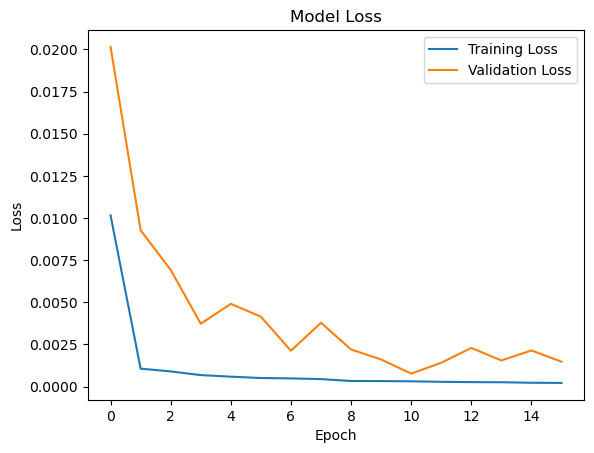

In [133]:
# Define sequence length and create sequences
sequence_length = 500

X, y = create_sequences(scaled_data, sequence_length)

# Split data into train and test sets
split_index = int(len(X) * 0.8)
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

# Build a more complex RNN model
model = Sequential([
    Input(shape=(sequence_length, 1)),
    SimpleRNN(units=50, return_sequences=True, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
    SimpleRNN(units=15, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
    Dropout(0.2),
    Dense(units=1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train, y_train, epochs=30, batch_size=32, verbose=1, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test, verbose=0)

# Make predictions
predictions = model.predict(X_test)

# Plot loss curves
plot_loss(history)

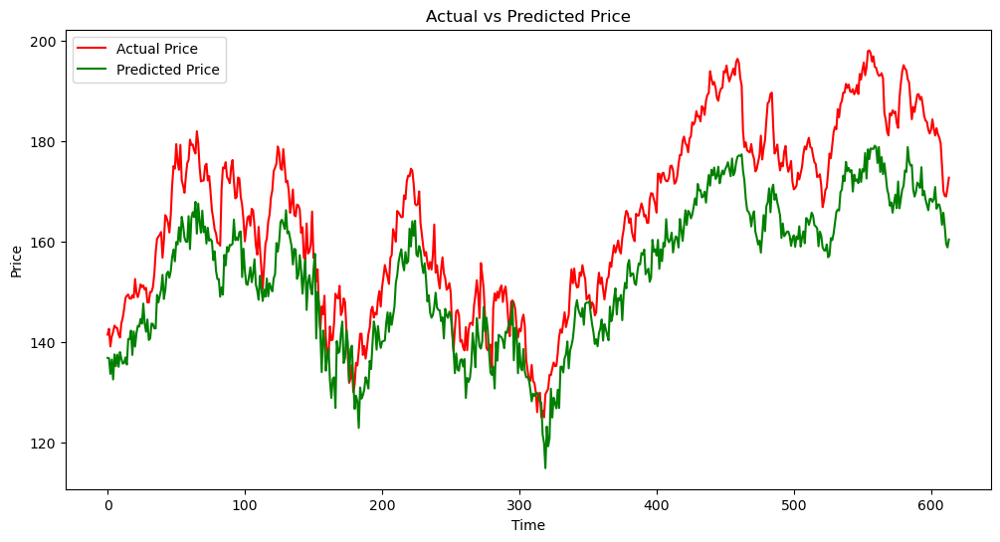

In [134]:
import matplotlib.pyplot as plt

# Inverse transform the scaled data to get actual prices
y_test_actual = scaler.inverse_transform(y_test)
predictions_actual = scaler.inverse_transform(predictions)

# Plot the actual and predicted prices
plt.figure(figsize=(12, 6))
plt.plot(y_test_actual, color='red', label='Actual Price')
plt.plot(predictions_actual, color='green', label='Predicted Price')
plt.title('Actual vs Predicted Price')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━

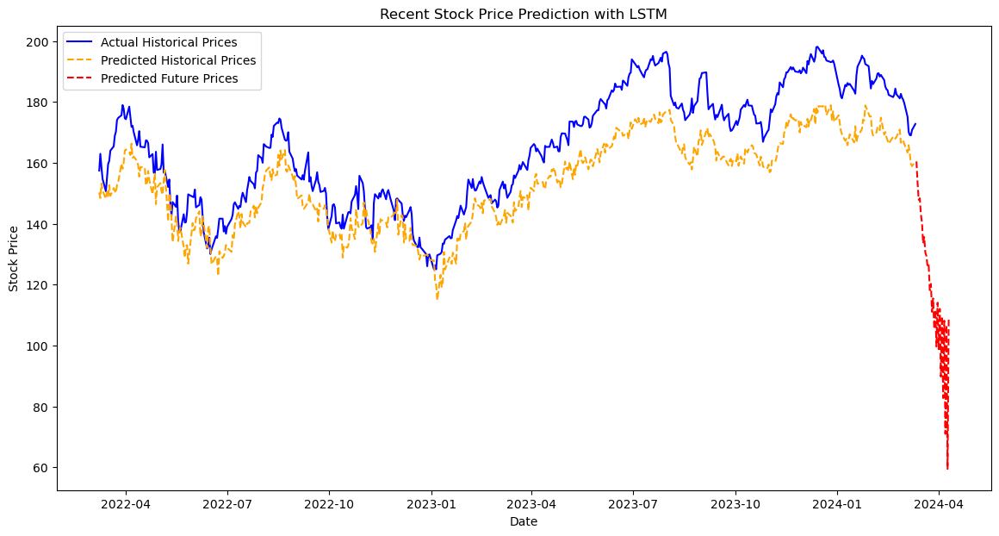

In [135]:
# Making predictions on the entire historical dataset
historical_predictions = model.predict(np.vstack((X_train, X_test)))
historical_predictions_scaled = scaler.inverse_transform(historical_predictions)

# Combine historical actual prices and predictions for plotting
historical_dates = apple_df.index[sequence_length:len(historical_predictions_scaled) + sequence_length]
historical_actual = scaler.inverse_transform(scaled_data[sequence_length:len(historical_predictions_scaled) + sequence_length])

# Making future predictions
n_future_steps = 30  # Adjusting to predict 10 steps into the future
future_predictions = []
current_sequence = X_test[-1].reshape((1, sequence_length, 1))

for _ in range(n_future_steps):
    predicted_value = model.predict(current_sequence)
    future_predictions.append(predicted_value[0, 0])
    current_sequence = np.roll(current_sequence, -1)
    current_sequence[0, -1, 0] = predicted_value

future_predictions_scaled = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

# Creating a timeline for historical and future predictions
future_dates = pd.date_range(start=apple_df.index[-1] + pd.Timedelta(days=1), periods=n_future_steps)

# time period to display (e.g., the last 2 years)
start_date = pd.Timestamp('2024-03-08') - pd.DateOffset(years=2) 

# Filter historical data to include only the last 2 years
recent_historical_mask = historical_dates >= start_date
recent_historical_dates = historical_dates[recent_historical_mask]
recent_historical_actual = historical_actual[recent_historical_mask]
recent_historical_predictions = historical_predictions_scaled[recent_historical_mask]

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(recent_historical_dates, recent_historical_actual, label='Actual Historical Prices', color='blue')
plt.plot(recent_historical_dates, recent_historical_predictions, label='Predicted Historical Prices', color='orange', linestyle='--')
plt.plot(future_dates, future_predictions_scaled, label='Predicted Future Prices', color='red', linestyle='--')
plt.title('Recent Stock Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

## LSTM

Next, we are going to apply LSTM. 

First of all, for simplicity, we are going to apply the LSTM model just on the apple stock and then see how it performs on all the stocks

For the sake of the LSTM model, we are going to remove the tomorrow column as well as the target column and strictly focus on "Close" as the target

The following is a function to visualize the validation and the training loss of the model

## Baseline LSTM

Epoch 1/30


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0079 - val_loss: 0.0446
Epoch 2/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 7.0006e-04 - val_loss: 0.0028
Epoch 3/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 6.6018e-05 - val_loss: 0.0010
Epoch 4/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 5.5921e-05 - val_loss: 0.0012
Epoch 5/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 5.2847e-05 - val_loss: 0.0011
Epoch 6/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 5.5189e-05 - val_loss: 0.0013
Epoch 7/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 4.7441e-05 - val_loss: 0.0013
Epoch 8/30
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 5.1024e-05 - val_loss: 0.0014
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


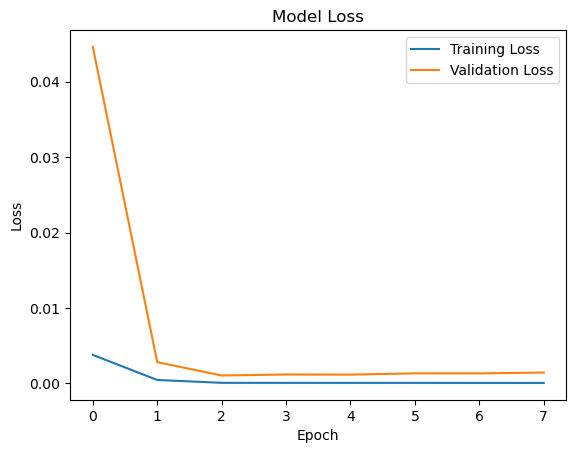

In [136]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

# Data preprocessing
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(apple_df['Close'].values.reshape(-1, 1))

# Define sequence length
sequence_length = 500

X, y = create_sequences(scaled_data, sequence_length)


# Split data into train and test sets
split_index = int(len(X) * 0.8)
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Build Baseline LSTM model
model = Sequential([
    LSTM(units=10, return_sequences=False, input_shape=(sequence_length, 1)),
    Dense(units=1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model with early stopping and history
history = model.fit(X_train, y_train, epochs=30, batch_size=32, verbose=1, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test, verbose=0)

# Make predictions
predictions = model.predict(X_test)

# Plot loss curves
plot_loss(history)

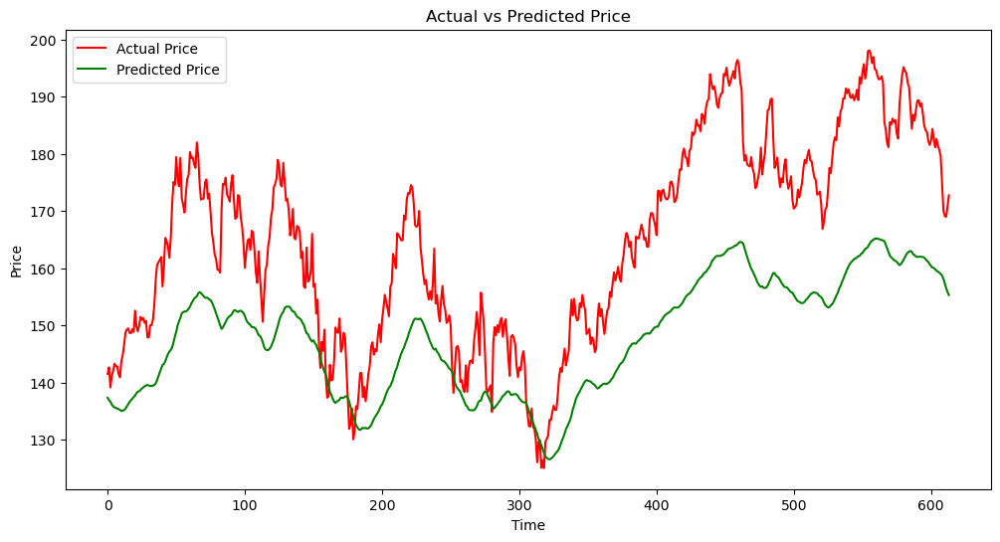

In [137]:
import matplotlib.pyplot as plt

# Inverse transform the scaled data to get actual prices
y_test_actual = scaler.inverse_transform(y_test)
predictions_actual = scaler.inverse_transform(predictions)

# Plot the actual and predicted prices
plt.figure(figsize=(12, 6))
plt.plot(y_test_actual, color='red', label='Actual Price')
plt.plot(predictions_actual, color='green', label='Predicted Price')
plt.title('Actual vs Predicted Price')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

96/96 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━

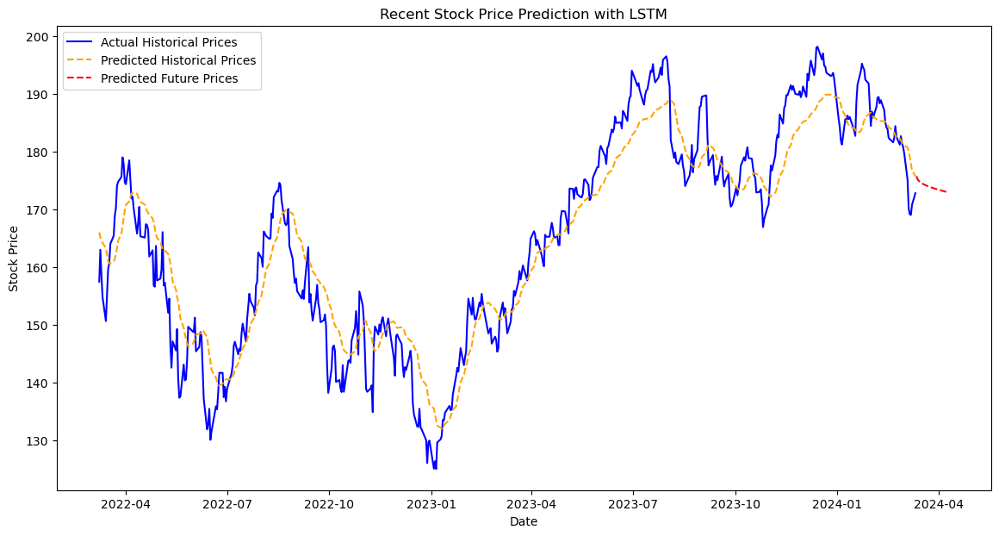

In [125]:
# Making predictions on the entire historical dataset
historical_predictions = model.predict(np.vstack((X_train, X_test)))
historical_predictions_scaled = scaler.inverse_transform(historical_predictions)

# Combine historical actual prices and predictions for plotting
historical_dates = apple_df.index[sequence_length:len(historical_predictions_scaled) + sequence_length]
historical_actual = scaler.inverse_transform(scaled_data[sequence_length:len(historical_predictions_scaled) + sequence_length])

# Making future predictions
n_future_steps = 30  # Adjusting to predict 10 steps into the future
future_predictions = []
current_sequence = X_test[-1].reshape((1, sequence_length, 1))

for _ in range(n_future_steps):
    predicted_value = model.predict(current_sequence)
    future_predictions.append(predicted_value[0, 0])
    current_sequence = np.roll(current_sequence, -1)
    current_sequence[0, -1, 0] = predicted_value

future_predictions_scaled = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

# Creating a timeline for historical and future predictions
future_dates = pd.date_range(start=apple_df.index[-1] + pd.Timedelta(days=1), periods=n_future_steps)

# time period to display (e.g., the last 2 years)
start_date = pd.Timestamp('2024-03-08') - pd.DateOffset(years=2) 

# Filter historical data to include only the last 2 years
recent_historical_mask = historical_dates >= start_date
recent_historical_dates = historical_dates[recent_historical_mask]
recent_historical_actual = historical_actual[recent_historical_mask]
recent_historical_predictions = historical_predictions_scaled[recent_historical_mask]

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(recent_historical_dates, recent_historical_actual, label='Actual Historical Prices', color='blue')
plt.plot(recent_historical_dates, recent_historical_predictions, label='Predicted Historical Prices', color='orange', linestyle='--')
plt.plot(future_dates, future_predictions_scaled, label='Predicted Future Prices', color='red', linestyle='--')
plt.title('Recent Stock Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()


As seen by the graph, the LSTM model was able to get close to the actual price. What needs to be done now is to look for ways to improve this model. We are going to try to tune the hyperparameters.

Judging by the validation curve, there might be a high chance the model is overfitting, meaning that it performs well on the test data but will not achieve the same results to unseen new data. In the following, we are going increase the complexity of the model by adding layers and nodes to the nerual network architecture.

## LSTM improved

Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.0045 - val_loss: 0.0056
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 4.6889e-04 - val_loss: 0.0011
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 2.9749e-04 - val_loss: 0.0020
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 2.2704e-04 - val_loss: 0.0014
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 1.9726e-04 - val_loss: 0.0017
Epoch 6/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 1.9611e-04 - val_loss: 0.0010
Epoch 7/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 1.8029e-04 - val_loss: 6.0586e-04
Epoch 8/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 1.5715e-04 - val_loss: 8.5458e-04
Epoch 9/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 1.6030e-04 - val_loss: 8.3426e-04
Epoch 10/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 1.4120e-04 - val_loss: 6.9444e-04
Epoch 11/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 1.2923e-04 - val_loss: 5.6008e-04
Epoch 12/50
31

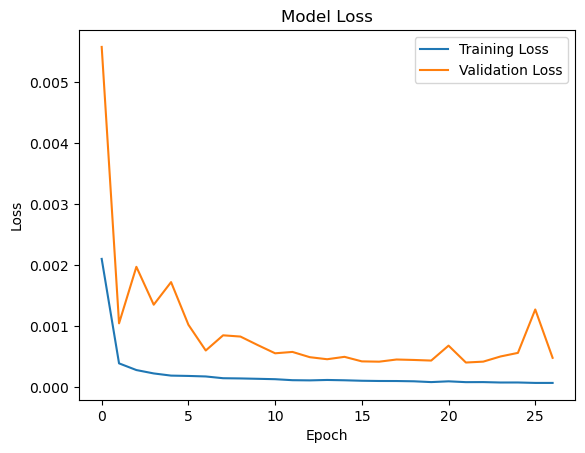

In [138]:
from keras.layers import Activation
from tensorflow.keras.optimizers import Adam

# Define sequence length
sequence_length = 500

X, y = create_sequences(scaled_data, sequence_length)

# Split data into train and test sets
split_index = int(len(X) * 0.8)
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define learning rate
learning_rate = 0.001

# Create an Adam optimizer with the custom learning rate
optimizer = Adam(learning_rate=learning_rate)

# Build more complex LSTM model with ReLU activation
model = Sequential([
    LSTM(units=50, return_sequences=False, input_shape=(sequence_length, 1)),
    Dropout(0.2),
    Dense(units=1)
])

# Compile the model
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model with early stopping
history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_split=0.2, verbose=1, callbacks=[early_stopping])

# Evaluate the model
loss = model.evaluate(X_test, y_test, verbose=0)

# Make predictions
predictions = model.predict(X_test)


# Plot loss curves
plot_loss(history)

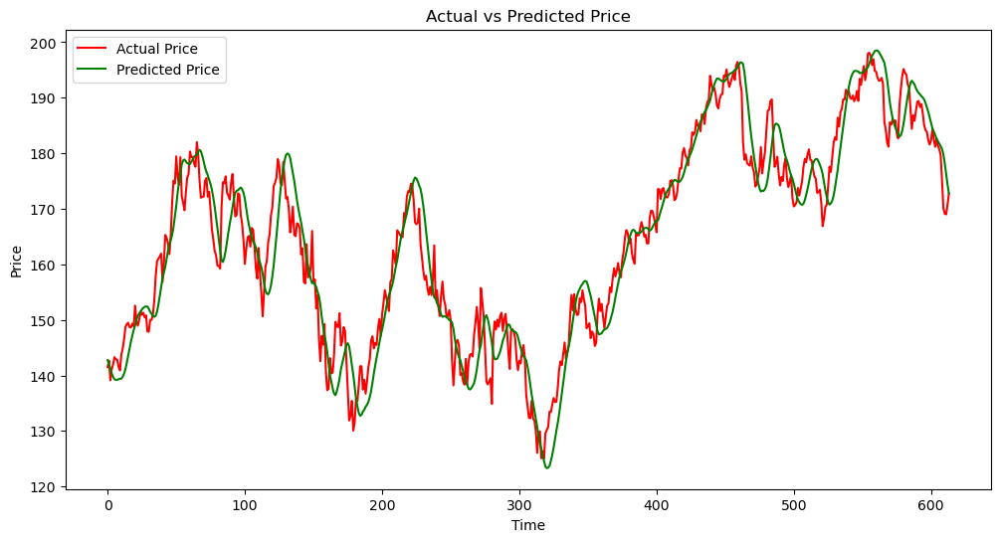

In [139]:
import matplotlib.pyplot as plt

# Inverse transform the scaled data to get actual prices
y_test_actual = scaler.inverse_transform(y_test)
predictions_actual = scaler.inverse_transform(predictions)

# Plot the actual and predicted prices
plt.figure(figsize=(12, 6))
plt.plot(y_test_actual, color='red', label='Actual Price')
plt.plot(predictions_actual, color='green', label='Predicted Price')
plt.title('Actual vs Predicted Price')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

96/96 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


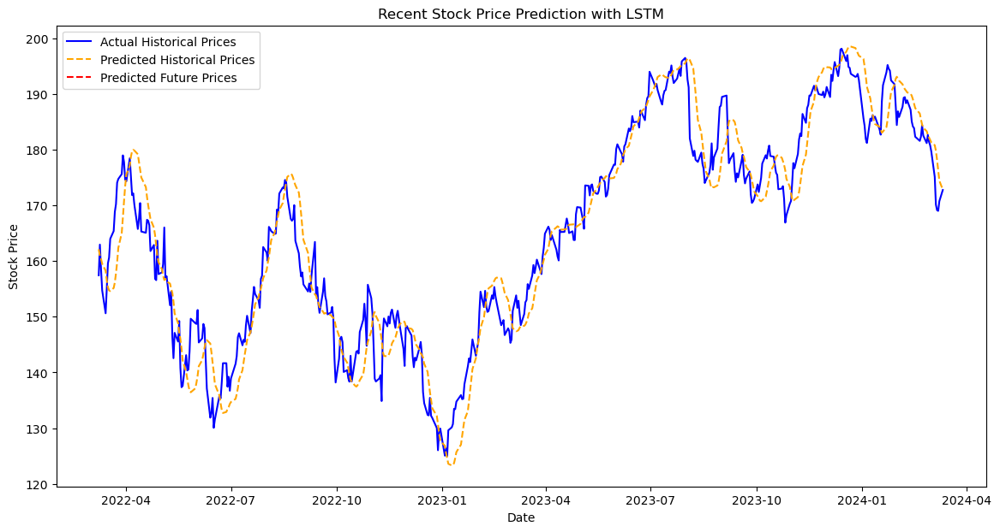

In [141]:
# Making predictions on the entire historical dataset
historical_predictions = model.predict(np.vstack((X_train, X_test)))
historical_predictions_scaled = scaler.inverse_transform(historical_predictions)

# Combine historical actual prices and predictions for plotting
historical_dates = apple_df.index[sequence_length:len(historical_predictions_scaled) + sequence_length]
historical_actual = scaler.inverse_transform(scaled_data[sequence_length:len(historical_predictions_scaled) + sequence_length])

# Making future predictions
n_future_steps = 1  # Adjusting to predict 10 steps into the future
future_predictions = []
current_sequence = X_test[-1].reshape((1, sequence_length, 1))

for _ in range(n_future_steps):
    predicted_value = model.predict(current_sequence)
    future_predictions.append(predicted_value[0, 0])
    current_sequence = np.roll(current_sequence, -1)
    current_sequence[0, -1, 0] = predicted_value

future_predictions_scaled = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

# Creating a timeline for historical and future predictions
future_dates = pd.date_range(start=apple_df.index[-1] + pd.Timedelta(days=1), periods=n_future_steps)

# time period to display (e.g., the last 2 years)
start_date = pd.Timestamp('2024-03-08') - pd.DateOffset(years=2) 

# Filter historical data to include only the last 2 years
recent_historical_mask = historical_dates >= start_date
recent_historical_dates = historical_dates[recent_historical_mask]
recent_historical_actual = historical_actual[recent_historical_mask]
recent_historical_predictions = historical_predictions_scaled[recent_historical_mask]

# Plotting
plt.figure(figsize=(14, 7))
plt.plot(recent_historical_dates, recent_historical_actual, label='Actual Historical Prices', color='blue')
plt.plot(recent_historical_dates, recent_historical_predictions, label='Predicted Historical Prices', color='orange', linestyle='--')
plt.plot(future_dates, future_predictions_scaled, label='Predicted Future Prices', color='red', linestyle='--')
plt.title('Recent Stock Price Prediction with LSTM')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()


In [142]:
model.save('my_lstm_model.keras')  # Saves the model to a HDF5 file

*********************

## ARIMA

In [143]:
apple_close = apple['Close'].copy()

NameError: name 'apple' is not defined

In [144]:
print(apple_close.head())

NameError: name 'apple_close' is not defined

In [145]:
apple_close.describe()

NameError: name 'apple_close' is not defined

In [ ]:
apple_close.asfreq('B')

## ADF test

The Augmented Dickey-Fuller (ADF) test is a statistical test used to determine whether a unit root is present in a time series dataset. In the context of ARIMA modeling, the ADF test is used to check the stationarity of a time series, which is important when building an ARIMA model.

Stationarity implies that the statistical properties of a time series, such as mean, variance, and autocorrelation, do not change over time. ARIMA models require the underlying time series to be stationary or made stationary through differencing.

The ADF test helps determine whether differencing is necessary to achieve stationarity. If the p-value from the ADF test is less than a significance level (e.g., 0.05), then the null hypothesis (non-stationarity) is rejected, indicating that the time series is stationary. On the other hand, if the p-value is greater than the significance level, the null hypothesis cannot be rejected, suggesting that the time series is non-stationary.

The ADF test is used in ARIMA modeling to assess the stationarity of a time series, which is non-negotiable for determining the appropriate parameters (d, p, and q) of the ARIMA model.

In [ ]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller

# Perform ADF test
result = adfuller(apple_close)

# Extract and print results
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))


The p value (0.9764553250780864) of after application of the ADF test is very high. It is clear that the price is non-stationary.

It is usual for prices of a stock to be non-stationary, because if they were, a trading strategy such as buying low and selling high would work.

To address the issue of non-stationarity, I will compute the returns from the price series. Returns are used in financial analysis because they tend to exhibit stationarity properties. By taking the difference between consecutive prices and normalizing them, I will obtain a series of returns that may be more suitable for analysis.

## Autocorrelation Function

The autocorrelation function (ACF) is a statistical tool used to measure the correlation between a time series and its lagged values. In the context of analyzing stock price data, the ACF can provide insights into the presence of serial correlation, which refers to the degree of correlation between consecutive observations in a time series.

The ACF is particularly relevant when assessing the stationarity of a time series. In the context of the Augmented Dickey-Fuller (ADF) test, the ACF can help determine the presence of serial correlation in the residuals of the model. If the residuals show significant autocorrelation at certain lags, it may indicate that the model fails to capture some underlying patterns in the data.

In [ ]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Plot Apple Close Prices
axs[0].plot(apple_close)
axs[0].set_title('Apple Close Prices')
axs[0].set_xlabel('Date')
axs[0].set_ylabel('Price')

# Plot ACF
plot_acf(apple_close, lags=50, ax=axs[1])
axs[1].set_title('Autocorrelation Function (ACF) of Apple Close Prices')
axs[1].set_xlabel('Lag')
axs[1].set_ylabel('Autocorrelation')

plt.tight_layout()
plt.show()

In [ ]:
# Take the first difference of the series
diff = apple_close.diff().dropna()

# Perform ADF test on the differenced series
result_diff = adfuller(diff)

# Extract and print results
print('ADF Statistic (After differencing):', result_diff[0])
print('p-value (After differencing):', result_diff[1])
print('Critical Values:')
for key, value in result_diff[4].items():
    print('\t%s: %.3f' % (key, value))


The ADF test statistic after differencing is significantly negative (-22.576), and the p-value is very close to zero (0.0). This indicates strong evidence against the null hypothesis of non-stationarity, suggesting that the differenced series is stationary.

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot differenced close price
ax1.plot(diff)
ax1.set_title('Differenced Close Price')
ax1.set_xlabel('Date')
ax1.set_ylabel('Differenced Close Price')
ax1.grid(True)

# Plot autocorrelation function
plot_acf(diff, lags=50, ax=ax2)
ax2.set_title('Autocorrelation Function')
ax2.set_xlabel('Lag')
ax2.set_ylabel('Autocorrelation')
ax2.grid(True)

plt.show()

2 as q

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
import matplotlib.pyplot as plt

# Correct the subplot setup to create two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot differenced close price on the first subplot
ax1.plot(diff)
ax1.set_title('Differenced Close Price')
ax1.set_xlabel('Date')
ax1.set_ylabel('Differenced Close Price')
ax1.grid(True)

# Plot Partial Autocorrelation Function (PACF) on the second subplot
plot_pacf(diff, lags=50, ax=ax2) 
ax2.set_title('Partial Autocorrelation Function')
ax2.set_xlabel('Lag')
ax2.set_ylabel('Partial Autocorrelation')
ax2.grid(True)

plt.tight_layout()
plt.show()



2 as p

## Arima model

In [ ]:
print(apple_close.index.freq)

In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Define the model
model = ARIMA(apple_close, order=(2, 1, 2)) 

# Fit the model
model_fit = model.fit()

# Summary of the model
print(model_fit.summary())

* AR Terms: The model includes two autoregressive terms (ar.L1 and ar.L2) with coefficients -0.5165 and -0.9824, respectively, both  significant (p < 0.0001), indicating a impact on the model.
* MA Terms: Two moving average terms (ma.L1 and ma.L2) are present with coefficients 0.5322 and 0.9985, respectively, also showing significance. This highlights the influence of past error terms on the current value.

In [ ]:
# Plot the actual close prices
plt.figure(figsize=(10, 6))
plt.plot(apple_close, label='Actual Close Prices', color='blue')

# Plot the fitted values
plt.plot(model_fit.fittedvalues, label='Fitted Values', color='red')

plt.title('Actual vs. Fitted Close Prices')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


Overall, the ARIMA(2, 1, 2) model provides a meaningful fit to the stock closing prices, capturing key autoregressive and moving average effects.

In [ ]:
import seaborn as sns

# Get the residuals from the model
residuals = model_fit.resid

# Plotting the distribution of residuals
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.distplot(residuals, color="blue", kde=True, hist=True)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.show()

The distribution of the residuals around the 0-mean indicates that patterns were captured well and without any bias.

In [ ]:
import pmdarima as pm
from pmdarima import auto_arima


# Use auto_arima to find the best ARIMA model
model = auto_arima(apple_close, start_p=1, start_q=1,
                   max_p=8, max_q=8, max_d=2,
                   seasonal=False,  # Set to True if the series is seasonal
                   trace=True, error_action='ignore',  
                   suppress_warnings=True, stepwise=True)

print(model.summary())


The Parameter-tuning process indicates that ARIMA(1,1,1) yields the best fit for this specific dataset. Lets fit the aforementioned model.

In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Define the model
model = ARIMA(apple_close, order=(1, 1, 1)) 

# Fit the model
model_fit = model.fit()

# Summary of the model
print(model_fit.summary())

In [ ]:
# Plot the actual close prices
plt.figure(figsize=(10, 6))
plt.plot(apple_close, label='Actual Close Prices', color='blue')

# Plot the fitted values
plt.plot(model_fit.fittedvalues, label='Fitted Values', color='red')

plt.title('Actual vs. Fitted Close Prices')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


The results show that the difference between both ARIMA models is not significant. However, we are still going to choose ARIMA(1,1,1)

*****************